## Transfer Learning Inception V3 using Keras

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Please download the dataset from the below url

In [ ]:
# !nvidia-smi

In [ ]:
# !pip install keras

In [ ]:
# !pip install tensorflow-gpu

In [ ]:
# from tensorflow.compat.v1 import ConfigProto
# from tensorflow.compat.v1 import InteractiveSession

# config = ConfigProto()
# config.gpu_options.per_process_gpu_memory_fraction = 0.5
# config.gpu_options.allow_growth = True
# session = InteractiveSession(config=config)

In [ ]:
import tensorflow as tf
tf.__version__

'2.8.0'

In [ ]:
# Infinite loop to crash the RAM
# n  = 10000
# l = []
# while True:
#     n += 10000
#     l.append(n)

#Inceptionv3

In [ ]:
# # import the libraries as shown below
# import tensorflow
# from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
# from tensorflow.keras.models import Model
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# #from keras.applications.vgg16 import VGG16
# from tensorflow.keras.applications.inception_v3 import preprocess_input
# from tensorflow.keras.preprocessing import image
# from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
# from tensorflow.keras.models import Sequential
# import numpy as np
# from glob import glob
# #import matplotlib.pyplot as plt

#ResNET50


In [ ]:
# # import the libraries as shown below
# import tensorflow
# from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
# from tensorflow.keras.models import Model
# from tensorflow.keras.applications.resnet50 import ResNet50
# #from keras.applications.vgg16 import VGG16
# from tensorflow.keras.applications.resnet50 import preprocess_input
# from tensorflow.keras.preprocessing import image
# from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
# from tensorflow.keras.models import Sequential
# import numpy as np
# from glob import glob
# #import matplotlib.pyplot as plt

#EfficientNetB7

In [ ]:

# import the libraries as shown below
import tensorflow
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
#from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob
#import matplotlib.pyplot as plt

In [ ]:
# re-size all the images to this
IMAGE_SIZE = [229, 299]

train_path = '/content/drive/MyDrive/current_work/Strawberry/train'
valid_path = '/content/drive/MyDrive/current_work/Strawberry/val'
test_path = '/content/drive/MyDrive/current_work/Strawberry/test'



In [ ]:
# !ls "/content/drive/My Drive"

In [ ]:
# # Import the Vgg 16 library as shown below and add preprocessing layer to the front of VGG
# # Here we will be using imagenet weights

inception = InceptionResNetV2(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)



In [ ]:
len(inception.layers)

780

In [ ]:
# # Import the Vgg 16 library as shown below and add preprocessing layer to the front of VGG
# # Here we will be using imagenet weights

# resnet = ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)




In [ ]:
# Import the Vgg 16 library as shown below and add preprocessing layer to the front of VGG
# Here we will be using imagenet weights

# xception = Xception(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)



In [ ]:
# # don't train existing weights
# for layer in inception.layers[:len(inception.layers)-10]:
#     layer.trainable = False
# for layer in inception.layers[(len(inception.layers)-10):]:
#     layer.trainable = True

In [ ]:
# don't train existing weights : Transfer Learning method
for layer in resnet.layers:
    layer.trainable = False

In [ ]:
# don't train existing weights
# for layer in xception.layers:
#     layer.trainable = False

In [ ]:
# useful for getting number of output classes
# folders = glob('/content/drive/MyDrive/current_work/Cucumber/train/*')
folders = glob(train_path + '/*')

In [ ]:
folders

['/content/drive/MyDrive/current_work/Strawberry/train/Leaf-scorch',
 '/content/drive/MyDrive/current_work/Strawberry/train/Powdery-mildew',
 '/content/drive/MyDrive/current_work/Strawberry/train/Leaf-spot',
 '/content/drive/MyDrive/current_work/Strawberry/train/healthy']

In [ ]:
# # our layers - you can add more if you want
x = Flatten()(inception.output)

In [ ]:
# # our layers - you can add more if you want
# x = Flatten()(resnet.output)

In [ ]:
# our layers - you can add more if you want
# x = Flatten()(xception.output)

In [ ]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model = Model(inputs=inception.input, outputs=prediction)

In [ ]:
# prediction = Dense(len(folders), activation='softmax')(x)

# # create a model object
# model = Model(inputs=resnet.input, outputs=prediction)

In [ ]:
# prediction = Dense(len(folders), activation='softmax')(x)

# # create a model object
# model = Model(inputs=xception.input, outputs=prediction)

In [ ]:

# view the structure of the model
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 229, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 114, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 114, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
# tell the model what cost and optimization method to use
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)


In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True
                                   )

valid_datagen = ImageDataGenerator(rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True
                                   )

test_datagen = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
# training_set = train_datagen.flow_from_directory('/content/drive/MyDrive/data/train',
#                                                  target_size = (224, 224),
#                                                  batch_size = 32,
#                                                  class_mode = 'categorical')
training_set = train_datagen.flow_from_directory(train_path,
                                                 target_size = tuple(IMAGE_SIZE),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 2979 images belonging to 4 classes.


In [ ]:
training_set

In [ ]:
valid_set = train_datagen.flow_from_directory(valid_path,
                                              target_size = tuple(IMAGE_SIZE),
                                              batch_size = 32,
                                              class_mode = 'categorical')

Found 850 images belonging to 4 classes.


In [ ]:
# test_set = test_datagen.flow_from_directory('/content/drive/MyDrive/data/val',
#                                             target_size = (224, 224),
#                                             batch_size = 32,
#                                             class_mode = 'categorical')
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size = tuple(IMAGE_SIZE),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 429 images belonging to 4 classes.


In [ ]:
list(test_set.class_indices.keys())

['Leaf-scorch', 'Leaf-spot', 'Powdery-mildew', 'healthy']

In [ ]:
import datetime

In [ ]:
path = "logs\\fit\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = tensorflow.keras.callbacks.TensorBoard(log_dir=path, histogram_freq=1)

In [ ]:
# fit the model
# Run the cell. It will take some time to execute
r = model.fit(
  training_set,
  validation_data=valid_set,
  epochs=10,
  callbacks=[tensorboard_callback]
)


Epoch 1/10
94/94 [==============================] - 409s 4s/step - loss: 1.0012 - accuracy: 0.9023 - val_loss: 0.2129 - val_accuracy: 0.9741
Epoch 2/10
94/94 [==============================] - 122s 1s/step - loss: 0.2324 - accuracy: 0.9684 - val_loss: 0.1549 - val_accuracy: 0.9741
Epoch 3/10
94/94 [==============================] - 122s 1s/step - loss: 0.4037 - accuracy: 0.9577 - val_loss: 0.3139 - val_accuracy: 0.9659
Epoch 4/10
94/94 [==============================] - 122s 1s/step - loss: 0.8414 - accuracy: 0.9460 - val_loss: 0.4040 - val_accuracy: 0.9694
Epoch 5/10
94/94 [==============================] - 122s 1s/step - loss: 0.3501 - accuracy: 0.9648 - val_loss: 0.4535 - val_accuracy: 0.9647
Epoch 6/10
94/94 [==============================] - 122s 1s/step - loss: 0.2439 - accuracy: 0.9718 - val_loss: 0.0582 - val_accuracy: 0.9859
Epoch 7/10
94/94 [==============================] - 121s 1s/step - loss: 0.1423 - accuracy: 0.9829 - val_loss: 0.1271 - val_accuracy: 0.9859
Epoch 8/10
94

In [ ]:
%load_ext tensorboard

In [ ]:
# ! ls -l

In [ ]:
%tensorboard --logdir='logs\fit\20220415-124444'

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt

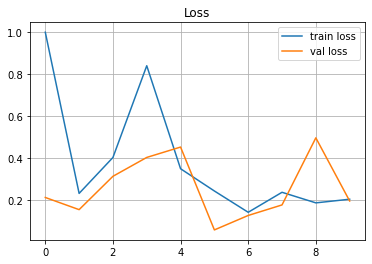

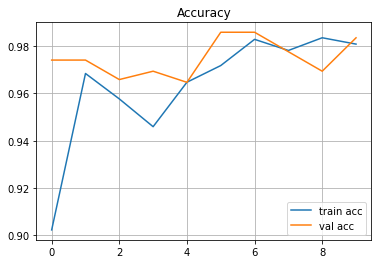

<Figure size 432x288 with 0 Axes>

In [ ]:
# plot the loss
plt.title('Loss')
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.grid()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.title('Accuracy')
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.grid()
plt.show()
plt.savefig('AccVal_acc')

In [ ]:
score = model.evaluate(test_set, verbose = 0) 

print('Test loss:', score[0]) 
print('Test accuracy:', score[1])

Test loss: 0.3034977316856384
Test accuracy: 0.9766899943351746


In [ ]:
test_set

In [ ]:
test_set[0]

(array([[[[0.7803922 , 0.7686275 , 0.8117648 ],
          [0.7372549 , 0.7254902 , 0.7686275 ],
          [0.7490196 , 0.7372549 , 0.7803922 ],
          ...,
          [0.69411767, 0.67058825, 0.7176471 ],
          [0.76470596, 0.7411765 , 0.78823537],
          [0.73333335, 0.70980394, 0.7568628 ]],
 
         [[0.76470596, 0.75294125, 0.7960785 ],
          [0.73333335, 0.72156864, 0.76470596],
          [0.73333335, 0.72156864, 0.76470596],
          ...,
          [0.7372549 , 0.7137255 , 0.7607844 ],
          [0.74509805, 0.72156864, 0.7686275 ],
          [0.7176471 , 0.69411767, 0.7411765 ]],
 
         [[0.75294125, 0.7411765 , 0.7843138 ],
          [0.7372549 , 0.7254902 , 0.7686275 ],
          [0.7254902 , 0.7137255 , 0.7568628 ],
          ...,
          [0.7686275 , 0.74509805, 0.79215693],
          [0.72156864, 0.69803923, 0.74509805],
          [0.7254902 , 0.7019608 , 0.7490196 ]],
 
         ...,
 
         [[0.62352943, 0.6       , 0.654902  ],
          [0.65098

In [ ]:
test_set[0][0][0].shape

(229, 299, 3)

In [ ]:
folders

['/content/drive/MyDrive/current_work/Strawberry/train/Leaf-scorch',
 '/content/drive/MyDrive/current_work/Strawberry/train/Powdery-mildew',
 '/content/drive/MyDrive/current_work/Strawberry/train/Leaf-spot',
 '/content/drive/MyDrive/current_work/Strawberry/train/healthy']

In [ ]:
# tab_labels = folders
# tab_labels
# for i in range(len(folders)):
#   folders[i] = folders[i].split("/")[-1]
# tab_labels = folders
# tab_labels

In [ ]:
tab_labels = list(test_set.class_indices.keys())

In [ ]:
tab_labels[np.argmax(test_set[0][1][0])]

'Leaf-scorch'

# Print ONE SINGLE image & label from test dataset


In [ ]:
test_set[0][1][0]

array([1., 0., 0., 0.], dtype=float32)

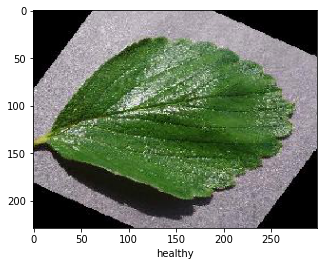

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
plt.figure(0)
plt.imshow(test_set[0][0][-1])
plt.xlabel(tab_labels[np.argmax(test_set[0][1][-1])])
plt.show()

In [ ]:
print(len(test_set[0]))

2


In [ ]:
test_set[0][0][0].shape

(229, 299, 3)

In [ ]:
img_test = np.expand_dims(test_set[0][0][0], axis=0)

In [ ]:
img_test.shape

(1, 229, 299, 3)

In [ ]:
test_set[0][1][0]

array([1., 0., 0., 0.], dtype=float32)

# Test for a specifc number of images from the test dataset (NUMBER_IMAGES)

In [ ]:
NUMBER_IMAGES = 3
tab_img = []
labels_img = []
for i in range(NUMBER_IMAGES):
  tab_img.append(test_set[0][0][i])
  labels_img.append(test_set[0][1][i])
print(labels_img)

[array([1., 0., 0., 0.], dtype=float32), array([0., 0., 0., 1.], dtype=float32), array([1., 0., 0., 0.], dtype=float32)]


In [ ]:
# tab_img =  [test_set[0][0][0],test_set[0][0][1],test_set[0][0][2] ] 
# labels_img = [test_set[0][1][0],test_set[0][1][1],test_set[0][1][2] ]
# type(np.array(tab_img))
# labels_img

In [ ]:
# pred = model.predict(img_test) 
# pred = np.argmax(pred, axis = 1)
# label = np.argmax(test_set[0][1][0],axis = 0)

preds = model.predict(np.array(tab_img)) 

labels = [ ]
predictions = []
for i in range(len(labels_img)):
  # print(np.argmax(labels_img[i]))
  labels.append(np.argmax(labels_img[i]))
for i in range(len(preds)):
  # print(np.argmax(labels_img[i]))
  predictions.append(np.argmax(preds[i]))
print("predictions",predictions) 
print("labels",labels)

predictions [0, 3, 0]
labels [0, 3, 0]


# Test for all images from the test dataset

In [ ]:
len(test_set[0][0])
test_imgs = test_set[0][0]
test_labels = test_set[0][1]

preds = model.predict(np.array(test_imgs)) 

labels = [ ]
predictions = []
for i in range(len(test_labels )):
  # print(np.argmax(labels_img[i]))
  labels.append(np.argmax(test_labels[i]))
for i in range(len(preds)):
  # print(np.argmax(labels_img[i]))
  predictions.append(np.argmax(preds[i]))
print("predictions",predictions) 
print("labels",labels)

predictions [0, 3, 0, 0, 2, 0, 0, 3, 0, 3, 2, 3, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 0, 0, 0, 3, 0, 0, 1, 1, 3]
labels [0, 3, 0, 0, 2, 0, 0, 3, 0, 3, 2, 3, 3, 0, 0, 0, 1, 0, 0, 3, 0, 0, 3, 0, 0, 0, 3, 0, 0, 1, 1, 3]


In [ ]:
int(len(test_set[0][0])/4)

8

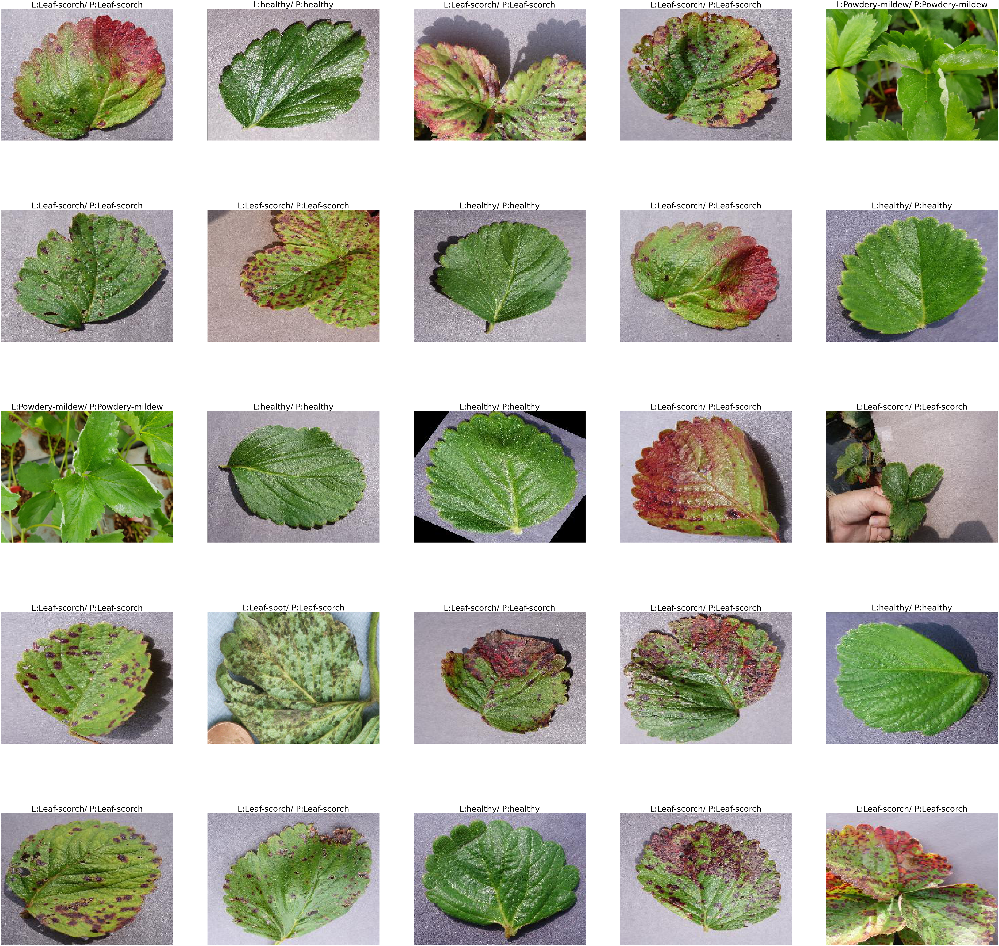

In [ ]:
from math import floor

if(len(test_imgs)>=36):
  rows = 6
  columns = 6
  num_images = rows*columns
  fig = plt.figure(figsize=(100, 100))
  for i in range(num_images):
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, i+1)
      
    # showing image
    plt.imshow(test_imgs[i])
    legend = str("L:" +tab_labels[labels[i]])  + "/" + " P:"  + str(tab_labels[predictions[i]])
    plt.axis('off')
    plt.title(legend, fontdict={'fontsize': 45})
else:
    rows = floor(np.sqrt(len(test_imgs)))
    columns = floor(np.sqrt(len(test_imgs)))
    num_images = rows*columns
    fig = plt.figure(figsize=(100, 100))
    for i in range(num_images):
      # Adds a subplot at the 1st position
      fig.add_subplot(rows, columns, i+1)
        
      # showing image
      plt.imshow(test_imgs[i])
      legend = str("L:" +tab_labels[labels[i]])  + "/" + " P:"  + str(tab_labels[predictions[i]])
      plt.axis('off')
      plt.title(legend, fontdict={'fontsize': 45})


In [ ]:
# num_rows = int(len(test_set[0][0])/4)
# num_cols = 4
# num_images = num_rows*num_cols

# plt.figure(0)
# plt.figure(figsize=(2*2*num_cols, 2*num_rows))
# fig, axes = plt.subplots(num_rows, num_cols)
# for i in range(num_images):
#     ax = axes[i//num_cols, i%num_cols]
#     ax.imshow(test_imgs[i])
#     ax.set_title('Label: {}'.format(test_labels[i]))
# plt.tight_layout()
# plt.show()

# #for i in range(num_images):
#  # plt.figure(0)
#   #plt.imshow(test_imgs[i])
#   #legend = str(tab_labels[labels[i]])  + "/" + str(tab_labels[predictions[i]])
#   #plt.xlabel(legend)
#  # plt.show()

In [ ]:
import datetime

In [ ]:
# save it as a h5 file

from tensorflow.keras.models import load_model

model.save('model_inception.h5')

In [ ]:
# model=load_model('model_resnet50.h5')

# Test for an image with a specific path

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

In [ ]:
img=image.load_img('/content/drive/MyDrive/current_work/Cucumber/test/Anthracnose/103.jpg',target_size=tuple(IMAGE_SIZE))



In [ ]:
x=image.img_to_array(img)

In [ ]:
x

array([[[130., 148., 108.],
        [138., 162.,  86.],
        [146., 172.,  85.],
        ...,
        [209., 172., 130.],
        [240., 202., 157.],
        [243., 206., 154.]],

       [[184., 187., 158.],
        [242., 249., 198.],
        [172., 177., 136.],
        ...,
        [169., 164., 142.],
        [177., 172., 150.],
        [155., 153., 128.]],

       [[209., 206., 171.],
        [242., 242., 192.],
        [170., 167., 136.],
        ...,
        [137., 139., 134.],
        [137., 139., 134.],
        [130., 135., 129.]],

       ...,

       [[110., 143.,  54.],
        [102., 134.,  51.],
        [ 97., 127.,  53.],
        ...,
        [ 92., 120.,  72.],
        [ 96., 124.,  75.],
        [ 93., 121.,  72.]],

       [[104., 132.,  45.],
        [ 94., 123.,  41.],
        [101., 129.,  55.],
        ...,
        [ 91., 119.,  70.],
        [ 89., 117.,  68.],
        [ 86., 116.,  64.]],

       [[132., 158.,  69.],
        [107., 132.,  49.],
        [104., 1

In [ ]:
x.shape

(229, 299, 3)

In [ ]:
x=x/255

In [ ]:
import numpy as np
x=np.expand_dims(x,axis=0)
img_data=preprocess_input(x)
img_data.shape

(1, 229, 299, 3)

In [ ]:
model.predict(img_data)

array([[1.0000000e+00, 3.3714803e-21, 3.5308341e-18, 3.0471885e-08]],
      dtype=float32)

In [ ]:
a=np.argmax(model.predict(img_data), axis=1)
tab_labels[a[0]]

'Leaf-scorch'